# Noise and filtering
[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/YoniChechik/AI_is_Math/blob/master/c_02b_filtering_and_resampling/noise_and_filtering.ipynb)



In [1]:
url = 'https://st2.depositphotos.com/1004999/10046/i/950/depositphotos_100460508-stock-photo-wonderful-view-of-eiffel-tower.jpg' #@param {type:"string"}

!wget "{url}" -O image.jpg

--2022-01-29 23:15:17--  https://st2.depositphotos.com/1004999/10046/i/950/depositphotos_100460508-stock-photo-wonderful-view-of-eiffel-tower.jpg
Resolving st2.depositphotos.com (st2.depositphotos.com)... 23.75.183.104
Connecting to st2.depositphotos.com (st2.depositphotos.com)|23.75.183.104|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 133400 (130K) [image/jpeg]
Saving to: ‘image.jpg’

image.jpg           100%[===================>] 130.27K  --.-KB/s    in 0.05s   

2022-01-29 23:15:17 (2.35 MB/s) - ‘image.jpg’ saved [133400/133400]



In [2]:
import numpy as np
import cv2
from matplotlib import pyplot as plt

figsize = (10, 10)

Get basic image:



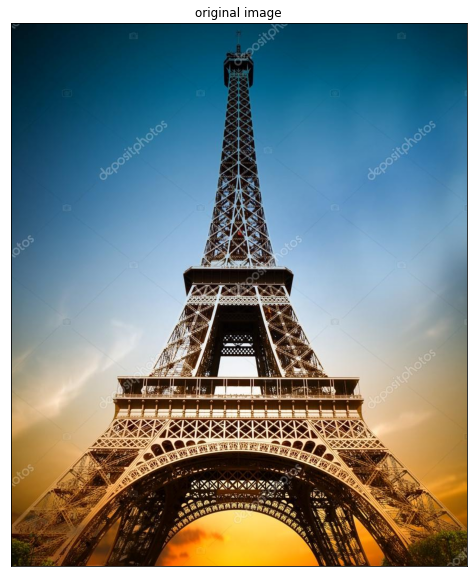

In [3]:
def plot_im(img, title):
    plt.figure(figsize=figsize)
    plt.imshow(img)
    plt.title(title)
    plt.xticks([])
    plt.yticks([])
    plt.show()


img = cv2.imread("image.jpg")
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plot_im(img, "original image")

## Mean filter



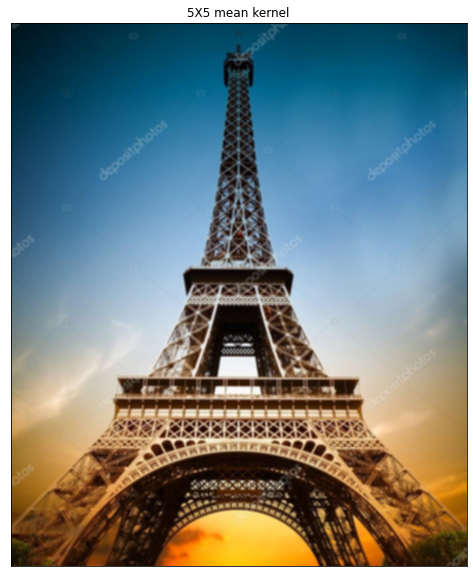

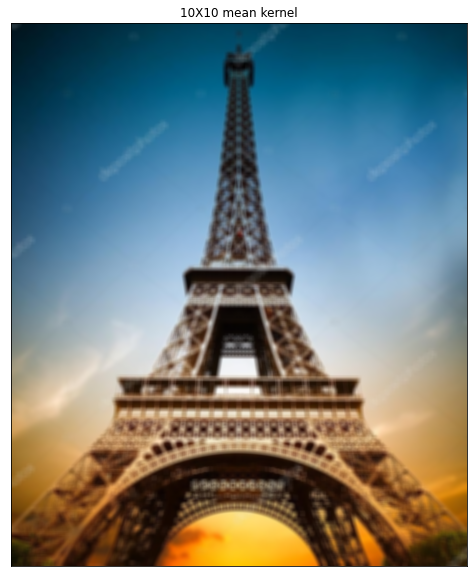

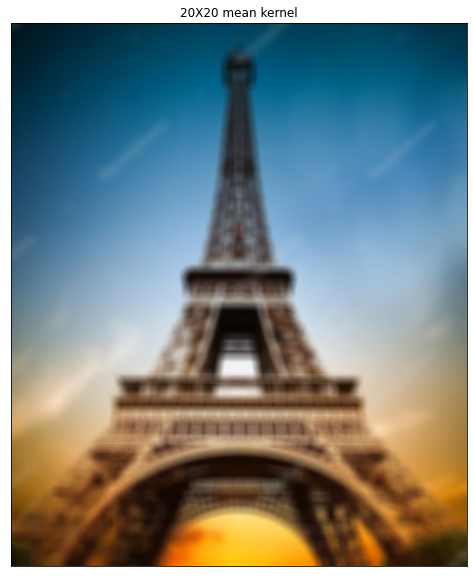

In [4]:
def mean_kernel_smoothing(img, sz):
    kernel = np.ones((sz, sz)) / (sz ** 2)
    dst = cv2.filter2D(img, -1, kernel)

    plot_im(dst, str(sz) + "X" + str(sz) + " mean kernel")

mean_kernel_smoothing(img, 5)
mean_kernel_smoothing(img, 10)
mean_kernel_smoothing(img, 20)

## Gaussian filter



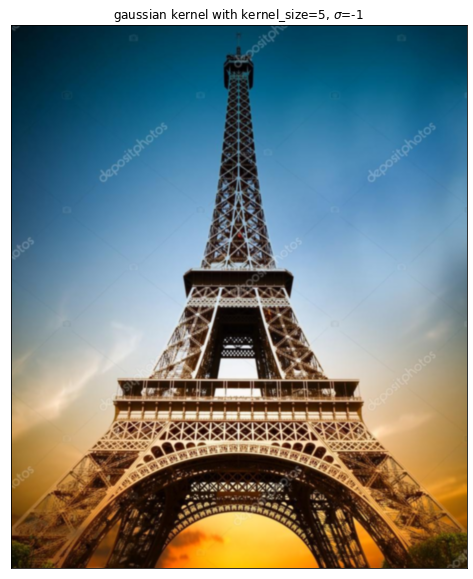

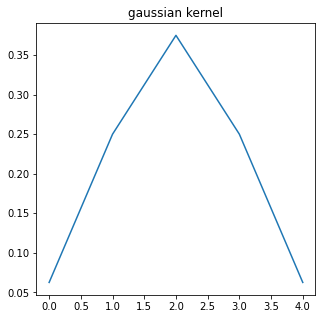

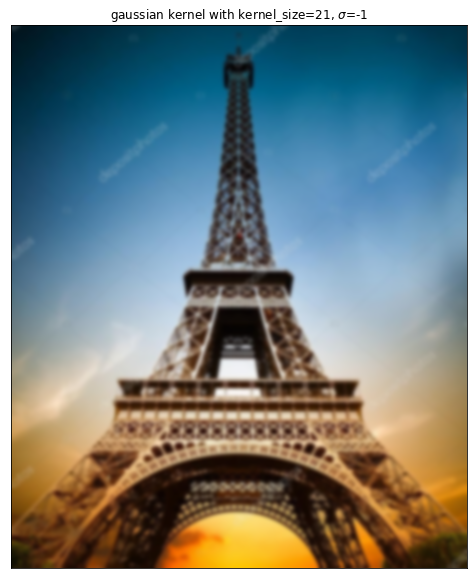

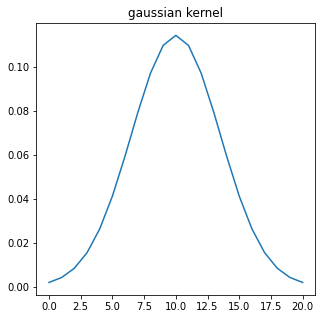

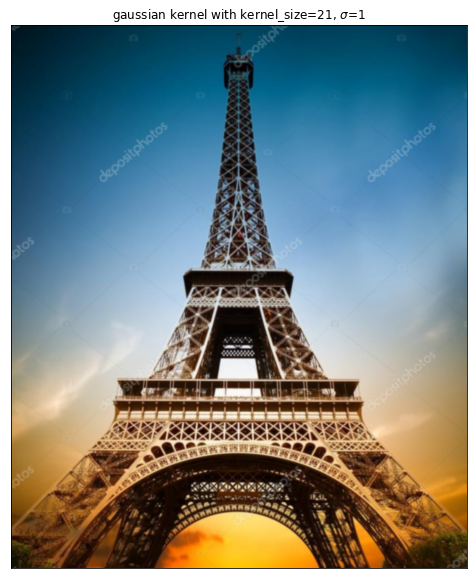

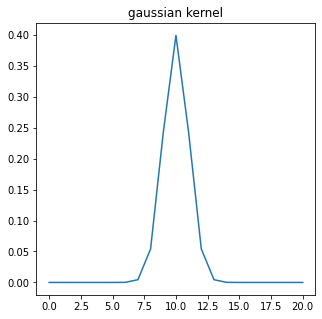

In [5]:
def gauss_blur(img, k_sz, sigma=-1, is_plot_kernel=False):
    blur = cv2.GaussianBlur(img, (k_sz, k_sz), sigma)
    plot_im(blur, "gaussian kernel with kernel_size=" + str(k_sz) + r", $\sigma$=" + str(sigma))
    if is_plot_kernel:
        # sigma=-1 will set the sigma size automatically
        gauss_ker = cv2.getGaussianKernel(k_sz, sigma)
        plt.figure(figsize=(figsize[0] / 2, figsize[1] / 2))
        plt.plot(gauss_ker)
        plt.title("gaussian kernel")
        plt.show()


gauss_blur(img, 5, is_plot_kernel=True)
gauss_blur(img, 21, is_plot_kernel=True)
gauss_blur(img, 21, 1, is_plot_kernel=True)

## Median filter



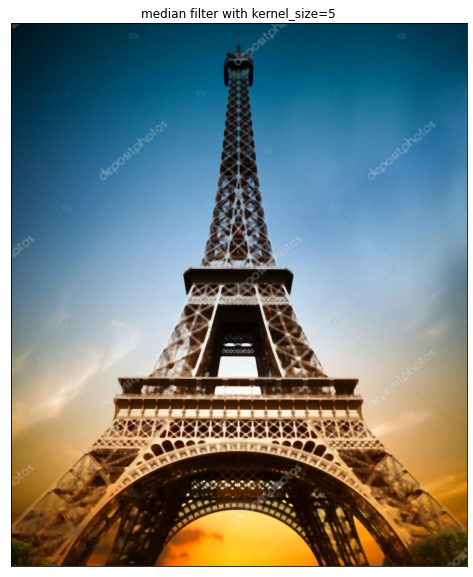

In [6]:
def median_filter(img, k_sz):
    res = cv2.medianBlur(img, k_sz)
    plot_im(res, "median filter with kernel_size=" + str(k_sz))

median_filter(img, 5)

## Noise addition func



In [7]:
def gauss_noise(image, gauss_var=1000):
    mean = 0
    sigma = gauss_var ** 0.5
    gauss = np.random.normal(mean, sigma, image.shape)

    res = image + gauss
    noisy = np.clip(res, 0, 255).astype(np.uint8)
    return noisy


def s_and_p_noise(image, s_p_ratio=0.04):
    out = np.copy(image)

    # Salt
    mask = np.random.rand(image.shape[0], image.shape[1]) <= s_p_ratio / 2
    out[mask] = 255

    # Pepper
    mask = np.random.rand(image.shape[0], image.shape[1]) <= s_p_ratio / 2
    out[mask] = 0
    return out

## Gaussian noise tests


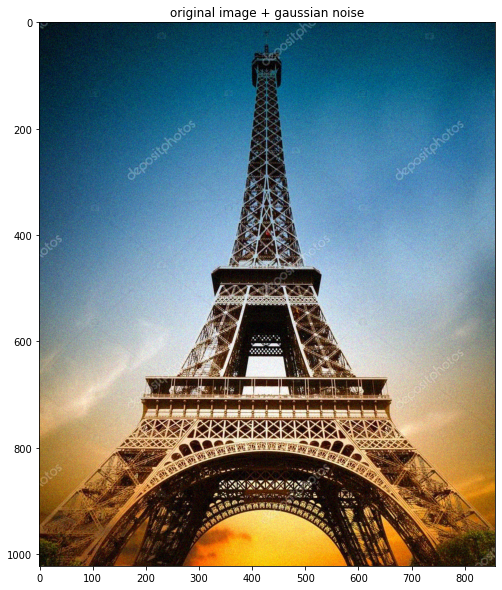

In [8]:
np.random.seed(1234)

gauss_noise_im = gauss_noise(img, gauss_var=180)
plt.figure(figsize=figsize)
plt.imshow(gauss_noise_im)
plt.title("original image + gaussian noise")
plt.show()

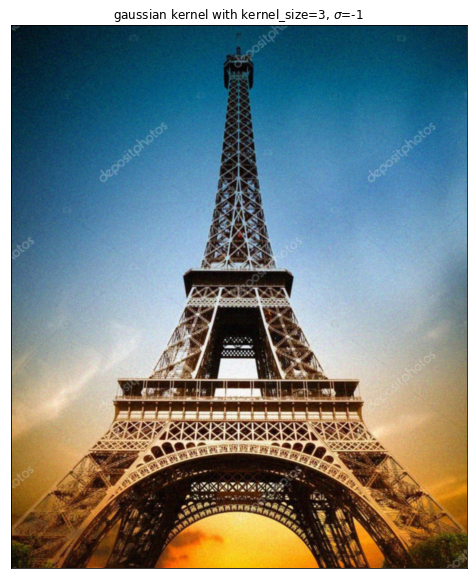

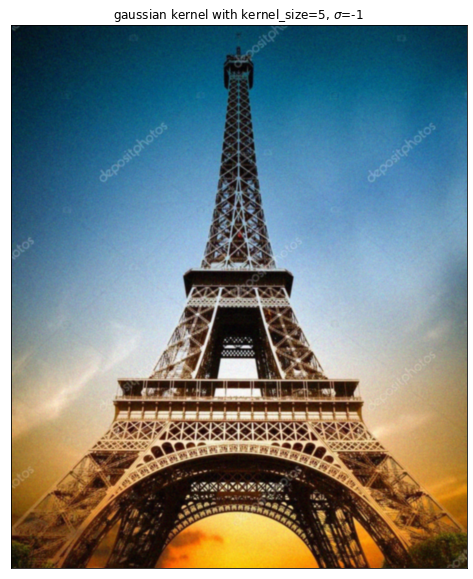

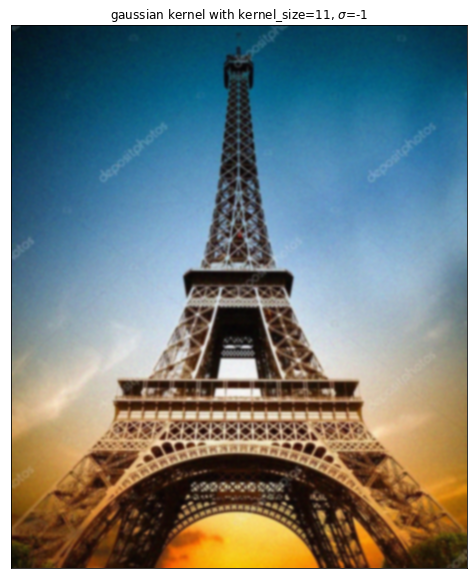

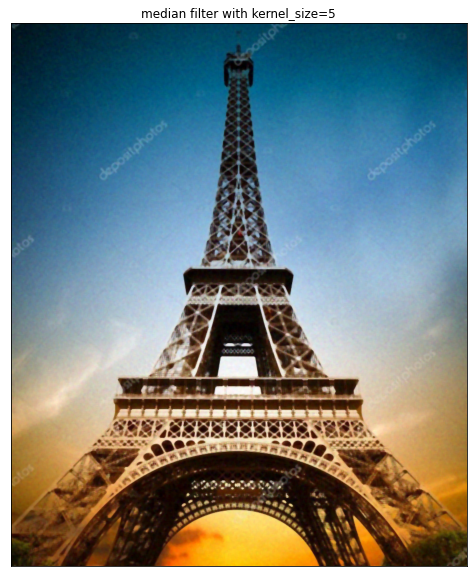

In [9]:
gauss_blur(gauss_noise_im, 3)
gauss_blur(gauss_noise_im, 5)
gauss_blur(gauss_noise_im, 11)
median_filter(gauss_noise_im, 5)

## Salt and pepper noise test



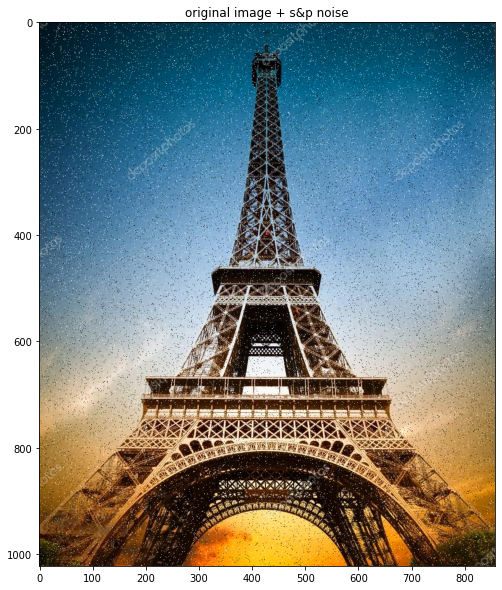

In [10]:
s_p_noise_im = s_and_p_noise(img, s_p_ratio=0.04)
plt.figure(figsize=figsize)
plt.imshow(s_p_noise_im)
plt.title("original image + s&p noise")
plt.show()

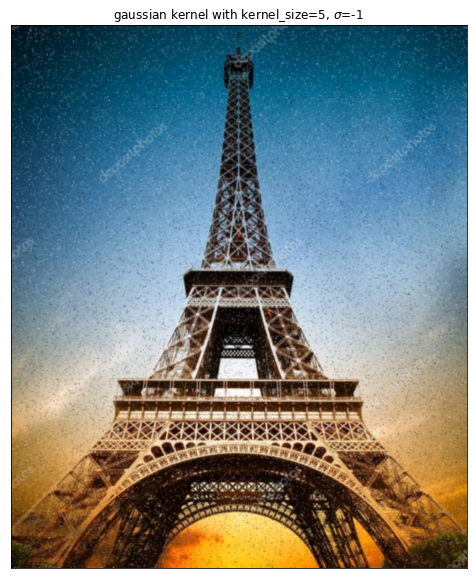

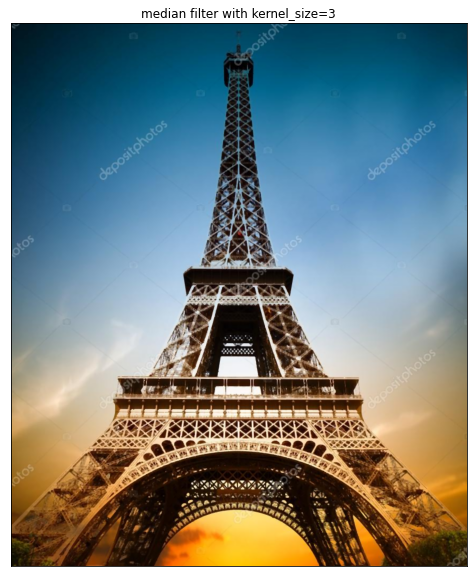

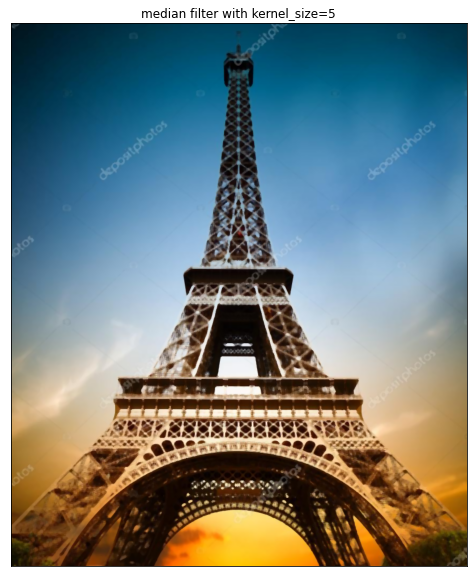

In [11]:
gauss_blur(s_p_noise_im, 5)
median_filter(s_p_noise_im, 3)
median_filter(s_p_noise_im, 5)

## Задание 1
Мы с вами рассмотрели разные типы фильтрации изображений, в качестве практической задачи вам требуется воспользоваться Билатеральным (Bilateral) фильтром. И отобразить результаты с помощью функции plt.show(). 

In [ ]:
def bilateral_filter(img, d):
  ## 
  ## plt.show()
  return 

## PCA и ICA

In [12]:
from sklearn.datasets import fetch_openml
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.decomposition import PCA, KernelPCA
from sklearn.decomposition import FastICA


X, y = fetch_openml(data_id=41082, as_frame=False, return_X_y=True)
X = MinMaxScaler().fit_transform(X)

In [13]:
def calculate_psnr(x, x_hat):
  mse = np.mean((x - x_hat)**2)
  return 20 * np.log10(255.0 / np.sqrt(mse))

In [14]:
X_train, X_test, y_train, y_test = train_test_split(
    X, y, stratify=y, random_state=0, train_size=1_000, test_size=100
)

rng = np.random.RandomState(0)
noise = rng.normal(scale=0.25, size=X_test.shape)
X_test_noisy = X_test + noise

noise = rng.normal(scale=0.25, size=X_train.shape)
X_train_noisy = X_train + noise

In [15]:
def plot_digits(X, title):
    """Small helper function to plot 100 digits."""
    fig, axs = plt.subplots(nrows=10, ncols=10, figsize=(8, 8))
    for img, ax in zip(X, axs.ravel()):
        ax.imshow(img.reshape((16, 16)), cmap="Greys")
        ax.axis("off")
    fig.suptitle(title, fontsize=24)

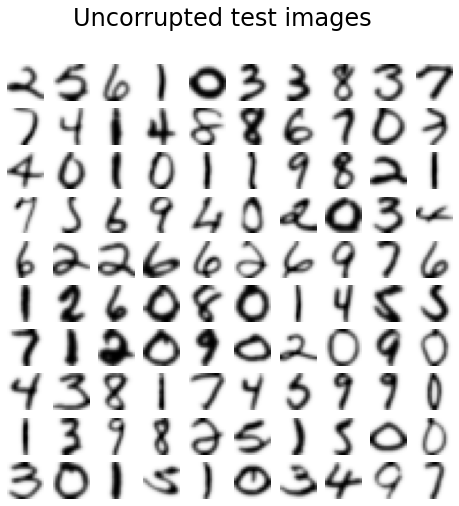

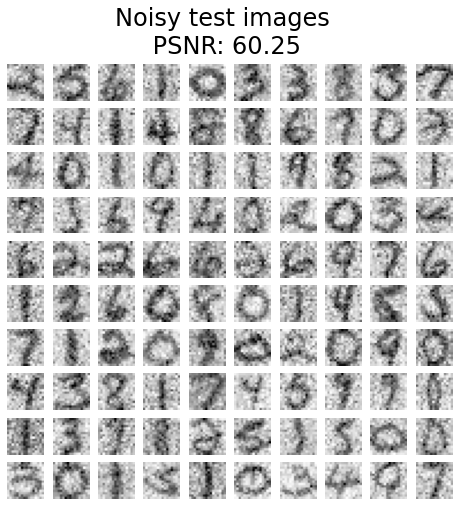

In [16]:
plot_digits(X_test, "Uncorrupted test images")
plot_digits(
    X_test_noisy, f"Noisy test images\n PSNR: {calculate_psnr(X_test, X_test_noisy):.2f}"
)

In [17]:
pca = PCA(n_components=32)
kernel_pca = KernelPCA(
    n_components=400, kernel="rbf", gamma=1e-3, fit_inverse_transform=True, alpha=5e-3
)

pca.fit(X_train_noisy)
_ = kernel_pca.fit(X_train_noisy)

In [18]:
X_reconstructed_kernel_pca = kernel_pca.inverse_transform(
    kernel_pca.transform(X_test_noisy)
)
X_reconstructed_pca = pca.inverse_transform(pca.transform(X_test_noisy))

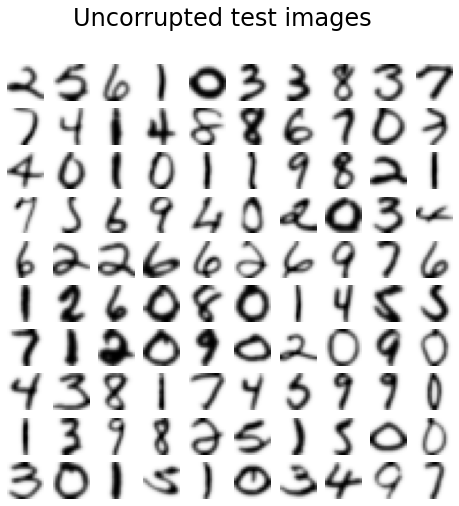

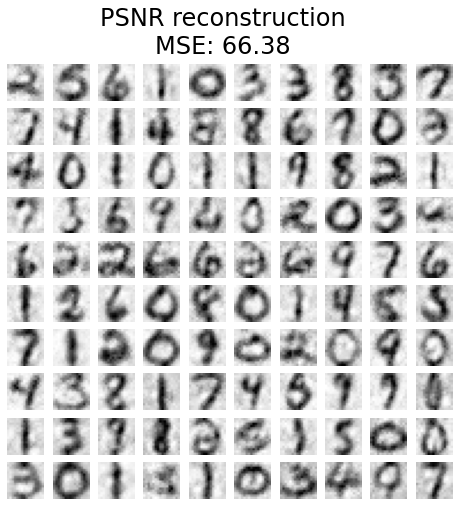

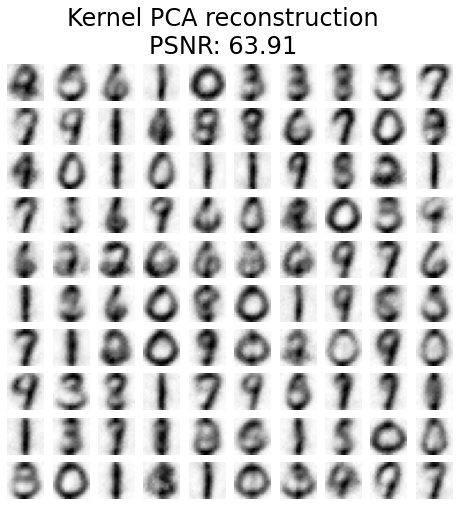

In [19]:
plot_digits(X_test, "Uncorrupted test images")
plot_digits(
    X_reconstructed_pca,
    f"PSNR reconstruction\nMSE: {calculate_psnr(X_test, X_reconstructed_pca):.2f}",
)
plot_digits(
    X_reconstructed_kernel_pca,
    "Kernel PCA reconstruction\n"
    f"PSNR: {calculate_psnr(X_test, X_reconstructed_kernel_pca):.2f}",
)

## Задание 2

Мы с вами убрали шум с помощью PCA, посчитали метрику PSNR, которая показала, что наш результат немного лучше, чем сильно замушленная картинка. Вам нужно проделать тоже самое с помощью алгоритма ICA. В качестве метрики, вы должны имплементировать SSIM. Ради эксперемента, можете сравнить PCA и ICA.

In [20]:
ica = FastICA(
    # adjust parameters
        random_state=0)

In [21]:
## Fit the ICA

In [ ]:
def calculate_ssim(x, x_hat):
  # return result

In [22]:
plot_digits(
    # plot results psnr
)

plot_digits(
    # plot results ssim    
)

TypeError: ignored

## Feel free to play!


В тексте мы говорили о множестве других методов удаления шума. Все они уже давно реализованы, потомучто считаются классикой. 

Взляните и попробуйте самостоятельно:
https://scikit-image.org/docs/stable/api/skimage.restoration.html